# Dataset-1

In [47]:
import random
import string
import heapq
import os
import numpy as np
import time
import matplotlib.pyplot as plt
from sklearn.datasets import fetch_olivetti_faces
from PIL import Image
import pandas as pd

In [14]:
N = [50, 100, 500, 1000, 5000] # set the values of N
t = 10 # set the number of files to generate for each value of N

for n in N:
    for i in range(t):
        filename = f"file_n{n}_i{i}.txt" # set the filename
        with open(filename, "w") as f:
            # generate a random string of length n consisting of lower case alphabets and numeric characters
            alphabet = string.ascii_lowercase + string.digits
            X = ''.join(random.choice(alphabet) for _ in range(n))
            f.write(X) # write the string to the file

In [15]:
class BinaryTree:
    def __init__(self,value,frequ):
        self.value = value
        self.frequ = frequ
        self.left = None
        self.right = None
        
    def __lt__(self,other):
        return self.frequ < other.frequ
    
    def __eq__(self,other):
        return self.frequ == other.frequ 

In [16]:
class Huffmancode:
    
    def __init__(self,path):
        self.path = path
        self.__heap = []
        self.__code = {}
        self.__reversecode = {}
        
    def __frequency_from_text(self,text):
        frequ_dict = {}
        for char in text:
            if char not in frequ_dict:
                frequ_dict[char] = 0
            frequ_dict[char] +=1
        print(f'Frequency dictionary : {frequ_dict}')
        return frequ_dict    
    def __Build_heap(self,frequency_dict):
        for key in frequency_dict:
            frequency = frequency_dict[key]
            binary_tree_node = BinaryTree(key,frequency)
            heapq.heappush(self.__heap , binary_tree_node)
    
    def __Build_Binary_Tree(self):
        while len(self.__heap) > 1:
            binary_tree_node_1 = heapq.heappop(self.__heap)
            binary_tree_node_2 = heapq.heappop(self.__heap)
            sum_of_freq = binary_tree_node_1.frequ + binary_tree_node_2.frequ
            newnode = BinaryTree(None,sum_of_freq)
            newnode.left = binary_tree_node_1
            newnode.right = binary_tree_node_2
            heapq.heappush(self.__heap,newnode)
        return
    def __Build_Tree_Code_Helper(self,root,curr_bits):
        if root is None:
            return
        if root.value is not None:
            self.__code[root.value] = curr_bits
            self.__reversecode[curr_bits] = root.value
            return
        self.__Build_Tree_Code_Helper(root.left,curr_bits+'0')
        self.__Build_Tree_Code_Helper(root.right,curr_bits+'1')
    
    def __Build_Tree_Code(self):
        root = heapq.heappop(self.__heap)
        self.__Build_Tree_Code_Helper(root,'')
        

    def __Build_Encoded_Text(self,text):
        encoded_text = ''
        for char in text:
            encoded_text += self.__code[char]
            
        return encoded_text
    def __Build_Padded_Text(self,encoded_text):
        padding_value = 8 - (len(encoded_text) % 8)
        for i in range(padding_value):
            encoded_text += '0'
            
        padded_info = "{0:08b}".format(padding_value)
        padded_encoded_text = padded_info + encoded_text
        return padded_encoded_text
    
    def __Build_Byte_Array(self, padded_text):
        array = []
        for i in range(0,len(padded_text) , 8):
            byte = padded_text[i:i+8]
            array.append(int(byte,2))
        return array    
    def compression(self):
        
        #To access the file and extract text from that file.
        filename,file_extension = os.path.splitext(self.path)
        output_path = filename + '.bin'
        with open (self.path,'r+') as file , open(output_path,'wb') as output:
            text = file.read()
            text = text.rstrip()
            
            frequency_dict = self.__frequency_from_text(text)

            #Calculate frequency of each text and store it in freq. dictionary

            build_heap = self.__Build_heap(frequency_dict)

            # Min heap for two minimum frquency.

            #Construct binary tree from Heap .

            self.__Build_Binary_Tree()

            #construct code from binary tree and stored it in dictionary.

            self.__Build_Tree_Code()

            #Construct encoded text.

            encoded_text = self.__Build_Encoded_Text(text)
            #output_filename = f"{N}_file_{i}.huf"
            #with open(output_filename, "wb") as output_file:
             #   output_file.write(encoded_text)

            #padding of text

            padded_text = self.__Build_Padded_Text(encoded_text)

            #We have to return that binary file as an output.

            bytes_array = self.__Build_Byte_Array(padded_text)

            final_bytes = bytes(bytes_array)
            output.write(final_bytes)
        print("Text is Compressed")
        print(f'Encoded_text is {encoded_text}')
        return output_path
    
    def __Remove_Padding(self,text):
        padded_info = text[:8]
        extra_padding = int(padded_info,2)
        text = text[8:]
        padding_removed_text = text[:-1*extra_padding]
        return padding_removed_text
    
    def __Decompress_Text(self,text):    
        decoded_text = ''
        current_bits = ''
        for bit in text:
            current_bits += bit
            if current_bits in self.__reversecode:
                character = self.__reversecode[current_bits]
                decoded_text += character
                current_bits = ""
        #print(decoded_text)
        return decoded_text
    def decompress(self,input_path):
        filename,file_extension = os.path.splitext(input_path)
        output_path = filename + '_decompressed' + '.txt'
        with open(input_path,'rb') as file , open(output_path,'w') as output:
            bit_string = ''
            byte = file.read(1)
            while byte:
                byte = ord(byte)
                bits = bin(byte)[2:].rjust(8,'0')
                bit_string += bits
                byte = file.read(1)
                
            actual_text = self.__Remove_Padding(bit_string)    
            decompressed_text = self.__Decompress_Text(actual_text)
            output.write(decompressed_text)
            #print(decompressed_text)
        return  decompressed_text
    

In [17]:
encoder_times = []
decoder_times = []
compression_factors = {}
for n in N:
    enc_times = []
    dec_times = []
    factors = []
    for i in range(t):
        filename = f"file_n{n}_i{i}.txt" # set the filename
        with open(filename, "r") as f:
            data = f.read()
            print(f'Input text : {data}')
            path = filename
            h = Huffmancode(path)
            orig_size = os.path.getsize(filename)

            
            # Measure encoding time
            start_time = time.time()
            output_path = h.compression()
            compressed_size = os.path.getsize(output_path)
            end_time = time.time()
            enc_times.append(end_time - start_time)
            
            factor = orig_size / compressed_size
            factors.append(factor)
            
            # Measure decoding time
            start_time = time.time()
            y=h.decompress(output_path)
            end_time = time.time()
            dec_times.append(end_time - start_time)
            print(f'Decompressed data : {y}')
            mse = np.mean((np.fromstring(data, dtype=np.uint8) - np.fromstring(y, dtype=np.uint8))**2)
            print(f"MSE for {n}_file_{i}: {mse:.2f}")
    compression_factors[n] = factors
    encoder_times.append(enc_times)
    decoder_times.append(dec_times)
    #print(f'Encoder times are {encoder_times}')
    #print(f'Decoder times are {decoder_times}')

Input text : eg00pvje7pl6tsu0itcrr67owtqd71lvmu7ieymwobtgubvnxg
Frequency dictionary : {'e': 3, 'g': 3, '0': 3, 'p': 2, 'v': 3, 'j': 1, '7': 4, 'l': 2, '6': 2, 't': 4, 's': 1, 'u': 3, 'i': 2, 'c': 1, 'r': 2, 'o': 2, 'w': 2, 'q': 1, 'd': 1, '1': 1, 'm': 2, 'y': 1, 'b': 2, 'n': 1, 'x': 1}
Text is Compressed
Encoded_text is 10001001010101010111101100001010001011011111010111111110011010001000101000011000001100100010111111011110111111011000011101110101111010110101011010100010010110000100000110101001111011011111001100100101001110001101110101110111001
Decompressed data : eg00pvje7pl6tsu0itcrr67owtqd71lvmu7ieymwobtgubvnxg
MSE for 50_file_0: 0.00
Input text : q9j5eg4q438sqa7uzxhie2mwdbx3amghgig79f2fiimtor4nm0
Frequency dictionary : {'q': 3, '9': 2, 'j': 1, '5': 1, 'e': 2, 'g': 4, '4': 3, '3': 2, '8': 1, 's': 1, 'a': 2, '7': 2, 'u': 1, 'z': 1, 'x': 2, 'h': 2, 'i': 4, '2': 2, 'm': 4, 'w': 1, 'd': 1, 'b': 1, 'f': 2, 't': 1, 'o': 1, 'r': 1, 'n': 1, '0': 1}
Text is Compressed
Encoded_text is 0111111

C:\Users\bashe\AppData\Local\Temp\ipykernel_29660\3305812564.py:34: DeprecationWarning: The binary mode of fromstring is deprecated, as it behaves surprisingly on unicode inputs. Use frombuffer instead
  mse = np.mean((np.fromstring(data, dtype=np.uint8) - np.fromstring(y, dtype=np.uint8))**2)


Decompressed data : a7sdlb7szrdsx1l9p8grih0pktn16l5kdl5wfta2f1hpe0rl6vfpukb3n6d2jb0qhq4k1zxwuup7kaifjvycrtuksm35dd4jka3ztbzw3e29fo1z1ec5y1r610ualwryd38yj4wk0ebq8ekpzu4xstcdhqsk4tm6uph96oml7aiuiikc8lgteabs9fvwievo6y3vvjn9n45gzo1oc3cosg69afd6sumf04qsx74mfwfsog8y0zvr5k3a8buggqre1wbdvhaob02i5oakheo12ua7xc3pg9v5uvibuhl6u36ovifa1gl9jpzm5gwuzuyi2k27wk6idvz8yicme8c25okh2wm3z8fcqfom1xxh1r3v99btelpyyljynfsckpxqlzwfq8vqsvxqzyingmwhzaontqgwmltjtx8pv0hiqzjh3e0htko8gex8bz8jbffwefvwyq4mldf4sbuakwm36g5wni77gam4tfy6qunwjt9ud9epgbk02te8gkz5484hd90u2lrd9fzh0xxaonhiep97n96u276ntpcf58v7qni2jr9fjprluxbmnz15hyaeqduboy10qn89kepm5yduc2ytegu4or1f63r31cek5fbzczvp1kfvneb5l3s4s4fsxak68pjvcuohvetgzhqi0lwhl6fd5u5r1jkgqi2kl0ki7lflj6l0bkzy6ghbhc3dru2rgigdqrv1qmor8rryms6ghlq2qoy1hdez5ba6psj0y9scvipudicrz9fc0rsrgj2digs3bd7o1qzt3gwde586m3u6cjo1yfcx3dud4gq8ol4h9zs8gj8sgm10na1g5eu44slj04gaol2nh6bp5okr3pgfisjhv91hp5oizdbok7h9npdmq3kmgzz4rnsbt15kckf4668d62vsb5zf87epzf1ntovssstm69y6wxim9u95srn5jwmvhucbx1n3ekiy6o7mklzd9tfk11g4

# Encoder and Decoder times

In [18]:
print(f'Encoder times are {encoder_times}')
print(f'Decoder times are {decoder_times}')

Encoder times are [[0.0, 0.0, 0.001009225845336914, 0.0, 0.0, 0.0, 0.014745712280273438, 0.00102996826171875, 0.0019865036010742188, 0.002015352249145508], [0.002016305923461914, 0.001971721649169922, 0.002001047134399414, 0.0030088424682617188, 0.0029058456420898438, 0.0, 0.0, 0.0, 0.0156252384185791, 0.0], [0.0, 0.015647172927856445, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.015624284744262695, 0.0], [0.0, 0.01565384864807129, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.015631675720214844, 0.0], [0.0, 0.0, 0.01561594009399414, 0.0, 0.0059967041015625, 0.00749969482421875, 0.0049974918365478516, 0.00022482872009277344, 0.004996299743652344, 0.004972934722900391]]
Decoder times are [[0.0, 0.0, 0.0010640621185302734, 0.0, 0.0, 0.0, 0.0010945796966552734, 0.0020194053649902344, 0.0010113716125488281, 0.0009877681732177734], [0.0009849071502685547, 0.0010311603546142578, 0.0019156932830810547, 0.0009999275207519531, 0.0004646778106689453, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 0.01570606231689453, 0.0,

# encoder time vs N

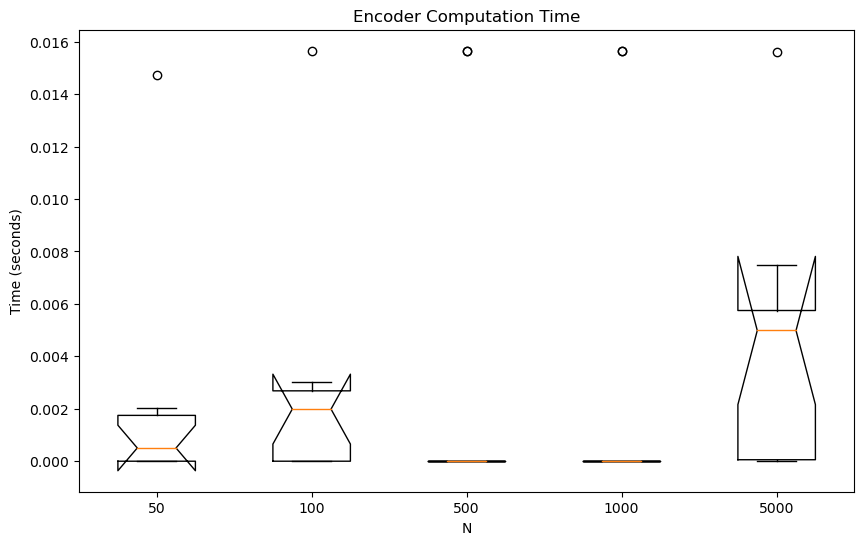

In [19]:
# Create a notch-box plot for encoder times
plt.figure(figsize=(10, 6))
plt.boxplot(encoder_times, notch=True)
plt.xticks(ticks=range(1, len(N)+1), labels=N)
plt.xlabel("N")
plt.ylabel("Time (seconds)")
plt.title("Encoder Computation Time")
plt.show()

# Decoder time vs N

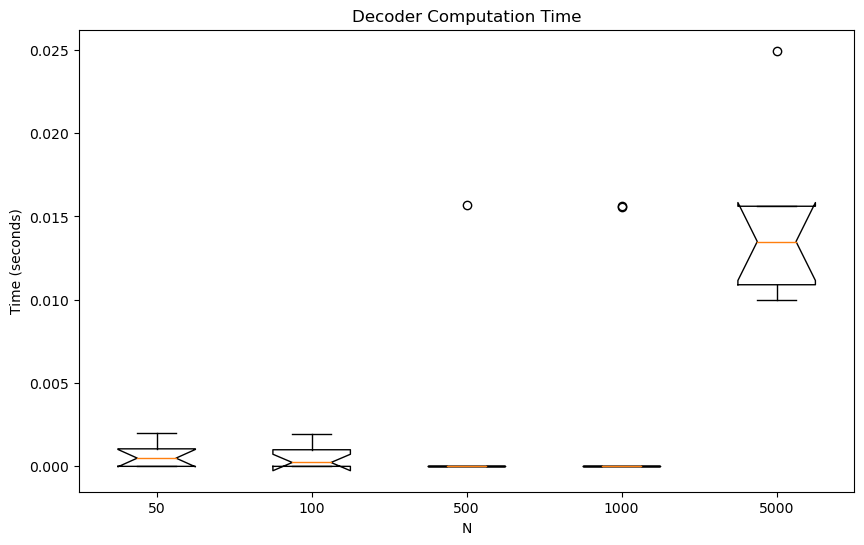

In [20]:
# Create a notch-box plot for decoder times
plt.figure(figsize=(10, 6))
plt.boxplot(decoder_times, notch=True)
plt.xticks(ticks=range(1, len(N)+1), labels=N)
plt.xlabel("N")
plt.ylabel("Time (seconds)")
plt.title("Decoder Computation Time")
plt.show()

# Compression time vs N

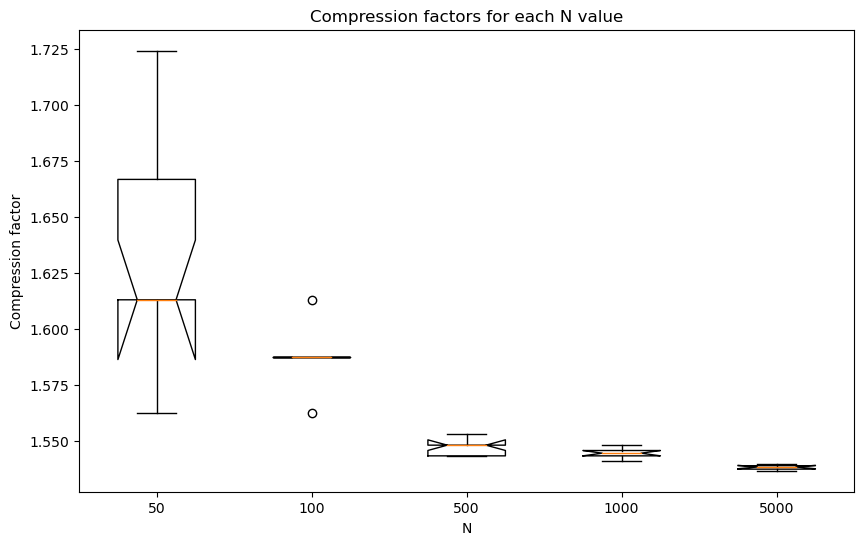

In [21]:
plt.figure(figsize=(10, 6))
plt.boxplot([compression_factors[n] for n in N], notch=True)
plt.xticks(range(1, len(N) + 1), N)
plt.xlabel('N')
plt.ylabel('Compression factor')
plt.title('Compression factors for each N value')
plt.show()

# Dataset - 2

In [67]:
class Huffmancodebmp:
    
    def __init__(self,path):
        self.path = path
        self.__heap = []
        self.__code = {}
        self.__reversecode = {}
        
    def __frequency_from_text(self,text):
        frequ_dict = {}
        for char in text:
            if char not in frequ_dict:
                frequ_dict[char] = 0
            frequ_dict[char] +=1
        print(f'Frequency dictionary : {frequ_dict}')
        return frequ_dict    
    def __Build_heap(self,frequency_dict):
        for key in frequency_dict:
            frequency = frequency_dict[key]
            binary_tree_node = BinaryTree(key,frequency)
            heapq.heappush(self.__heap , binary_tree_node)
    
    def __Build_Binary_Tree(self):
        while len(self.__heap) > 1:
            binary_tree_node_1 = heapq.heappop(self.__heap)
            binary_tree_node_2 = heapq.heappop(self.__heap)
            sum_of_freq = binary_tree_node_1.frequ + binary_tree_node_2.frequ
            newnode = BinaryTree(None,sum_of_freq)
            newnode.left = binary_tree_node_1
            newnode.right = binary_tree_node_2
            heapq.heappush(self.__heap,newnode)
        return
    def __Build_Tree_Code_Helper(self,root,curr_bits):
        if root is None:
            return
        if root.value is not None:
            self.__code[root.value] = curr_bits
            self.__reversecode[curr_bits] = root.value
            return
        self.__Build_Tree_Code_Helper(root.left,curr_bits+'0')
        self.__Build_Tree_Code_Helper(root.right,curr_bits+'1')
    
    def __Build_Tree_Code(self):
        root = heapq.heappop(self.__heap)
        self.__Build_Tree_Code_Helper(root,'')
        

    def __Build_Encoded_Text(self,text):
        encoded_text = ''
        for char in text:
            encoded_text += self.__code[char]
            
        return encoded_text
    def __Build_Padded_Text(self,encoded_text):
        padding_value = 8 - (len(encoded_text) % 8)
        for i in range(padding_value):
            encoded_text += '0'
            
        padded_info = "{0:08b}".format(padding_value)
        padded_encoded_text = padded_info + encoded_text
        return padded_encoded_text
    
    def __Build_Byte_Array(self, padded_text):
        array = []
        for i in range(0,len(padded_text) , 8):
            byte = padded_text[i:i+8]
            array.append(int(byte,2))
        return array    
    def compression(self):
        
        #To access the file and extract text from that file.
        filename,file_extension = os.path.splitext(self.path)
        output_path = filename + '.bin'
        with open (self.path,'rb') as file , open(output_path,'wb') as output:
            text = file.read()
            text = text.rstrip()
            #data = file.read()
            #output_data = self._compress(data)
            #output.write(output_data)
            
            frequency_dict = self.__frequency_from_text(text)

            #Calculate frequency of each text and store it in freq. dictionary

            build_heap = self.__Build_heap(frequency_dict)

            # Min heap for two minimum frquency.

            #Construct binary tree from Heap .

            self.__Build_Binary_Tree()

            #construct code from binary tree and stored it in dictionary.

            self.__Build_Tree_Code()

            #Construct encoded text.

            encoded_text = self.__Build_Encoded_Text(text)
            #output_filename = f"{N}_file_{i}.huf"
            #with open(output_filename, "wb") as output_file:
             #   output_file.write(encoded_text)

            #padding of text

            padded_text = self.__Build_Padded_Text(encoded_text)

            #We have to return that binary file as an output.

            bytes_array = self.__Build_Byte_Array(padded_text)

            final_bytes = bytes(bytes_array)
            output.write(final_bytes)
        print("Text is Compressed")
        print(f'Encoded_text is {encoded_text}')
        return output_path
    
    def __Remove_Padding(self,text):
        padded_info = text[:8]
        extra_padding = int(padded_info,2)
        text = text[8:]
        padding_removed_text = text[:-1*extra_padding]
        return padding_removed_text
    
    def __Decompress_Text(self,text):    
        decoded_text = ''
        current_bits = ''
        for bit in text:
            current_bits += bit
            if current_bits in self.__reversecode:
                character = self.__reversecode[current_bits]
                decoded_text += str(character)
                current_bits = ""
        #print(decoded_text)
        return decoded_text
    def decompress(self,input_path):
        filename,file_extension = os.path.splitext(input_path)
        output_path = filename + '_decompressed' + '.txt'
        with open(input_path,'rb') as file , open(output_path,'w') as output:
            bit_string = ''
            byte = file.read(1)
            while byte:
                byte = ord(byte)
                bits = bin(byte)[2:].rjust(8,'0')
                bit_string += bits
                byte = file.read(1)
                
            actual_text = self.__Remove_Padding(bit_string)    
            decompressed_text = self.__Decompress_Text(actual_text)
            output.write(decompressed_text)
            #print(decompressed_text)
        return  decompressed_text
    

In [68]:
encoder_times = []
decoder_times = []
compression_factors = []
olivetti = fetch_olivetti_faces()
for i in range(len(olivetti.images)):
    en_times = []
    dec_times = []
    #img = Image.fromarray(olivetti.images[i])
    image_path=f'olivetti_{i}.bmp'
    img = Image.fromarray((255*olivetti.images[i]).astype(np.uint8))
    #img.save(f"olivetti_{i}.bmp")
    bmp_image = Image.open(f"olivetti_{i}.bmp")
    I=np.array(bmp_image)
    print(I)
    #image_path='olivetti_0.bmp'
    img=Image.open(image_path)
    h = Huffmancodebmp(image_path)
    orig_size = os.path.getsize(f'olivetti_{i}.bmp')
    start_time = time.time()
    output_path = h.compression()
    huf_size = os.path.getsize(output_path)
    compression_factors.append(orig_size / huf_size)
    end_time = time.time()
    en_times.append(end_time - start_time)
    
    
    start_time=time.time()
    y=h.decompress(output_path)
    end_time=time.time()
    dec_times.append(end_time-start_time)
    encoder_times.append(en_times)
    decoder_times.append(dec_times)
    print(f'Decompressed data : {y}')

[[ 79  93 106 ...  94  84  77]
 [ 87 103 111 ...  94  86  80]
 [ 87 106 114 ...  96  86  75]
 ...
 [ 54  52  56 ...  38  42  44]
 [ 51  53  53 ...  37  41  42]
 [ 51  52  51 ...  38  41  40]]
Frequency dictionary : {66: 6, 77: 7, 54: 13, 20: 5, 0: 40, 4: 5, 40: 21, 64: 8, 1: 7, 8: 5, 16: 5, 196: 6, 14: 6, 2: 4, 3: 4, 5: 4, 6: 4, 7: 4, 9: 4, 10: 4, 11: 4, 12: 4, 13: 4, 15: 4, 17: 4, 18: 4, 19: 4, 21: 5, 22: 4, 23: 4, 24: 5, 25: 4, 26: 4, 27: 5, 28: 4, 29: 5, 30: 6, 31: 5, 32: 4, 33: 7, 34: 6, 35: 6, 36: 11, 37: 13, 38: 20, 39: 4, 41: 18, 42: 25, 43: 17, 44: 21, 45: 16, 46: 22, 47: 16, 48: 16, 49: 14, 50: 15, 51: 17, 52: 12, 53: 7, 55: 6, 56: 6, 57: 7, 58: 4, 59: 6, 60: 5, 61: 5, 62: 4, 63: 7, 65: 6, 67: 9, 68: 4, 69: 6, 70: 4, 71: 7, 72: 7, 73: 6, 74: 6, 75: 5, 76: 5, 78: 4, 79: 7, 80: 12, 81: 6, 82: 5, 83: 8, 84: 7, 85: 6, 86: 12, 87: 7, 88: 10, 89: 7, 90: 5, 91: 5, 92: 6, 93: 8, 94: 10, 95: 10, 96: 9, 97: 9, 98: 4, 99: 7, 100: 7, 101: 8, 102: 8, 103: 8, 104: 8, 105: 6, 106: 10, 107: 9

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Decompressed data : 66775420000000544004000064000640001080000001600196140019614000100010000001111222233334444555566667777888899991010101011111111121212121313131314141414151515151616161617171717181818181919191920202020212121212222222223232323242424242525252526262626272727272828282829292929303030303131313132323232333333333434343435353535363636363737373738383838393939394040404041414141424242424343434344444444454545454646464647474747484848484949494950505050515151515252525253535353545454545555555556565656575757575858585859595959606060606161616162626262636363636464646465656565666666666767676768686868696969697070707071717171727272727373737374747474757575757676767677777777787878787979797980808080818181818282828283838383848484848585858586868686878787878888888889898989909090909191919192929292939393939494949495959595969696969797979798989898999999991001001001001011011011011021021021021031031031031041041041041051051051051061061061061071071071071081081081081091091091091101101101101111111111111121121

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Decompressed data : 66775420000000544004000064000640001080000001600196140019614000100010000001111222233334444555566667777888899991010101011111111121212121313131314141414151515151616161617171717181818181919191920202020212121212222222223232323242424242525252526262626272727272828282829292929303030303131313132323232333333333434343435353535363636363737373738383838393939394040404041414141424242424343434344444444454545454646464647474747484848484949494950505050515151515252525253535353545454545555555556565656575757575858585859595959606060606161616162626262636363636464646465656565666666666767676768686868696969697070707071717171727272727373737374747474757575757676767677777777787878787979797980808080818181818282828283838383848484848585858586868686878787878888888889898989909090909191919192929292939393939494949495959595969696969797979798989898999999991001001001001011011011011021021021021031031031031041041041041051051051051061061061061071071071071081081081081091091091091101101101101111111111111121121

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[[202 201 199 ...  53  52  72]
 [201 201 200 ...  51  54  73]
 [200 202 202 ...  46  55  73]
 ...
 [122 125 125 ...  89 100  96]
 [121 122 121 ...  83  86  96]
 [122 120 116 ...  82  80  91]]
Frequency dictionary : {66: 12, 77: 20, 54: 11, 20: 5, 0: 40, 4: 5, 40: 5, 64: 10, 1: 7, 8: 5, 16: 6, 196: 6, 14: 6, 2: 4, 3: 4, 5: 4, 6: 4, 7: 4, 9: 4, 10: 4, 11: 4, 12: 4, 13: 4, 15: 4, 17: 4, 18: 4, 19: 4, 21: 6, 22: 4, 23: 5, 24: 4, 25: 5, 26: 5, 27: 6, 28: 5, 29: 8, 30: 6, 31: 5, 32: 6, 33: 8, 34: 5, 35: 6, 36: 8, 37: 4, 38: 5, 39: 4, 41: 8, 42: 9, 43: 6, 44: 10, 45: 9, 46: 6, 47: 6, 48: 5, 49: 6, 50: 6, 51: 7, 52: 7, 53: 8, 55: 8, 56: 10, 57: 5, 58: 4, 59: 8, 60: 11, 61: 7, 62: 7, 63: 10, 65: 7, 67: 8, 68: 9, 69: 8, 70: 12, 71: 10, 72: 12, 73: 18, 74: 11, 75: 11, 76: 25, 78: 4, 79: 16, 80: 18, 81: 28, 82: 22, 83: 20, 84: 19, 85: 20, 86: 22, 87: 27, 88: 34, 89: 30, 90: 22, 91: 32, 92: 43, 93: 40, 94: 36, 95: 26, 96: 34, 97: 41, 98: 4, 99: 45, 100: 57, 101: 72, 102: 61, 103: 80, 104: 51, 105: 

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Decompressed data : 66775420000000544004000064000640001080000001600196140019614000100010000001111222233334444555566667777888899991010101011111111121212121313131314141414151515151616161617171717181818181919191920202020212121212222222223232323242424242525252526262626272727272828282829292929303030303131313132323232333333333434343435353535363636363737373738383838393939394040404041414141424242424343434344444444454545454646464647474747484848484949494950505050515151515252525253535353545454545555555556565656575757575858585859595959606060606161616162626262636363636464646465656565666666666767676768686868696969697070707071717171727272727373737374747474757575757676767677777777787878787979797980808080818181818282828283838383848484848585858586868686878787878888888889898989909090909191919192929292939393939494949495959595969696969797979798989898999999991001001001001011011011011021021021021031031031031041041041041051051051051061061061061071071071071081081081081091091091091101101101101111111111111121121

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



# Encoding and Decoding Times

In [69]:
print(f"Encoding times for each image are {encoder_times}")
print(f"Decoding times for each image are {decoder_times}")

Encoding times for each image are [[0.008284330368041992], [0.015225410461425781], [0.010463714599609375], [0.009896516799926758], [0.010165214538574219], [0.014620304107666016], [0.010098457336425781], [0.01337575912475586], [0.00854349136352539], [0.009963274002075195], [0.015286922454833984], [0.011088132858276367], [0.014174222946166992], [0.01460123062133789], [0.016628503799438477], [0.012450695037841797], [0.008468389511108398], [0.015027761459350586], [0.00995016098022461], [0.010187387466430664], [0.01699090003967285], [0.008122920989990234], [0.010409832000732422], [0.007882118225097656], [0.009971380233764648], [0.009839057922363281], [0.01819300651550293], [0.010863065719604492], [0.011831521987915039], [0.03313493728637695], [0.01697254180908203], [0.02503347396850586], [0.01818084716796875], [0.008016347885131836], [0.011789321899414062], [0.0107574462890625], [0.012364387512207031], [0.013668537139892578], [0.010359764099121094], [0.01140141487121582], [0.018681287765502

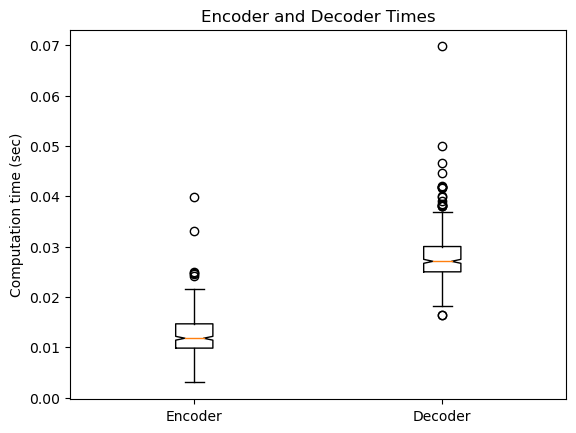

In [70]:
import matplotlib.pyplot as plt

# Flatten the encoder and decoder times lists
flat_encoder_times = [item for sublist in encoder_times for item in sublist]
flat_decoder_times = [item for sublist in decoder_times for item in sublist]

# Create a list of labels for the notch-box plot
labels = ['Encoder', 'Decoder']

# Create a list of data to plot
data = [flat_encoder_times, flat_decoder_times]

# Create a notch-box plot with separate notches for each data set
fig, ax = plt.subplots()
ax.boxplot(data, labels=labels, notch=True)

# Set the y-axis label and title
ax.set_ylabel('Computation time (sec)')
ax.set_title('Encoder and Decoder Times')

# Show the plot
plt.show()



# Scatter plot

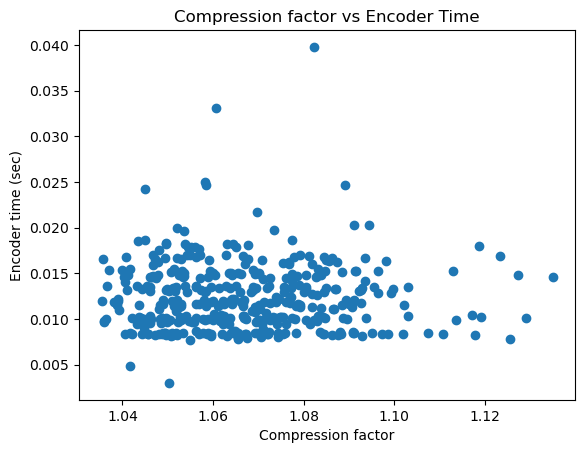

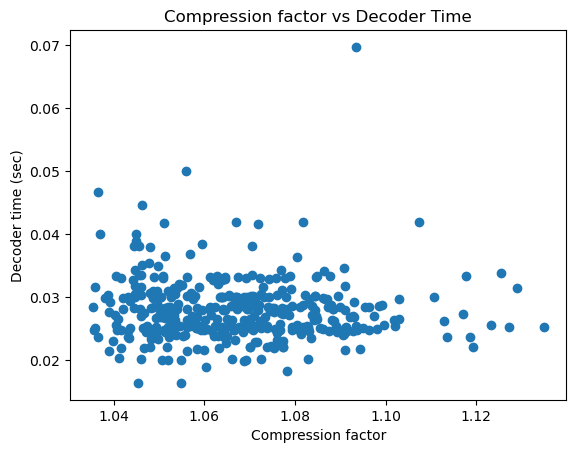

In [71]:
# Create a scatter plot of compression factor vs encoder time
fig, ax = plt.subplots()
ax.scatter(compression_factors, flat_encoder_times)
ax.set_xlabel('Compression factor')
ax.set_ylabel('Encoder time (sec)')
ax.set_title('Compression factor vs Encoder Time')

# Show the plot
plt.show()

# Create a scatter plot of compression factor vs decoder time
fig, ax = plt.subplots()
ax.scatter(compression_factors, flat_decoder_times)
ax.set_xlabel('Compression factor')
ax.set_ylabel('Decoder time (sec)')
ax.set_title('Compression factor vs Decoder Time')

# Show the plot
plt.show()


# Compression factor variation

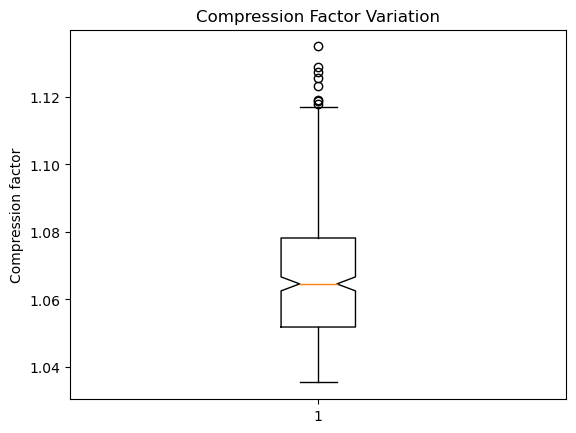

In [72]:
# Create a notch-box plot of the compression factors
fig, ax = plt.subplots()
ax.boxplot(compression_factors, notch=True)
ax.set_ylabel('Compression factor')
ax.set_title('Compression Factor Variation')

# Show the plot
plt.show()